<h1>Проект: Рынок заведений общественного питания Москвы.</h1>

**Описание проекта:**

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Для начала они просят вас — аналитика — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.
Постарайтесь сделать презентацию информативной и лаконичной. Её структура и оформление сильно влияют на восприятие информации читателями вашего исследования. Выбирать инструменты (matplotlib, seaborn и другие) и типы визуализаций вы можете самостоятельно.

Вам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер. 


**Описание данных `moscow_places.csv`:**

* `name` — название заведения;
* `address` — адрес заведения;
* `category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;
* `hours` — информация о днях и часах работы;
* `lat` — широта географической точки, в которой находится заведение;
* `lng` — долгота географической точки, в которой находится заведение;
* `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
* `price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
* `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
  - «Средний счёт: 1000–1500 ₽»;
  - «Цена чашки капучино: 130–220 ₽»;
  - «Цена бокала пива: 400–600 ₽» и так далее;
* `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
  - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
  - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
  - Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
* `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
  - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
  - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
  - Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
* `chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
  - 0 — заведение не является сетевым
  - 1 — заведение является сетевым
* `district` — административный район, в котором находится заведение, например Центральный административный округ;
* `seats` — количество посадочных мест.

<h1>Оглавление<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Загрузгка-данных-и-подготовка-их-к-анализу" data-toc-modified-id="Загрузгка-данных-и-подготовка-их-к-анализу-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Загрузгка данных и подготовка их к анализу</a></span></li><li><span><a href="#Предобработка-данных" data-toc-modified-id="Предобработка-данных-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Предобработка данных</a></span><ul class="toc-item"><li><span><a href="#Проверка-на-дубликаты-и-пропуски" data-toc-modified-id="Проверка-на-дубликаты-и-пропуски-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Проверка на дубликаты и пропуски</a></span></li><li><span><a href="#Создание-столбцов-street-и-is_24_7" data-toc-modified-id="Создание-столбцов-street-и-is_24_7-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>Создание столбцов street и is_24_7</a></span></li></ul></li><li><span><a href="#Анализ-данных" data-toc-modified-id="Анализ-данных-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Анализ данных</a></span><ul class="toc-item"><li><span><a href="#Анализ-и-визуализация-распределения-объектов-общественного-питания-по-категориям" data-toc-modified-id="Анализ-и-визуализация-распределения-объектов-общественного-питания-по-категориям-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Анализ и визуализация распределения объектов общественного питания по категориям</a></span></li><li><span><a href="#Анализ-и-визуализация-количества-посадочных-мест-в-заведениях-общественного-питания-по-категориям" data-toc-modified-id="Анализ-и-визуализация-количества-посадочных-мест-в-заведениях-общественного-питания-по-категориям-3.2"><span class="toc-item-num">3.2&nbsp;&nbsp;</span>Анализ и визуализация количества посадочных мест в заведениях общественного питания по категориям</a></span></li><li><span><a href="#Анализ-и-визуализация-соотношения-сетевых-и-несетевых-заведений-в-датасете" data-toc-modified-id="Анализ-и-визуализация-соотношения-сетевых-и-несетевых-заведений-в-датасете-3.3"><span class="toc-item-num">3.3&nbsp;&nbsp;</span>Анализ и визуализация соотношения сетевых и несетевых заведений в датасете</a></span></li><li><span><a href="#Анализ-и-визуализация-категорий-заведений-с-наибольшей-долей-сетевых-объектов" data-toc-modified-id="Анализ-и-визуализация-категорий-заведений-с-наибольшей-долей-сетевых-объектов-3.4"><span class="toc-item-num">3.4&nbsp;&nbsp;</span>Анализ и визуализация категорий заведений с наибольшей долей сетевых объектов</a></span></li><li><span><a href="#Анализ-и-визуализация-топ-15-популярных-сетевых-заведений-в-Москве-по-количеству-объектов" data-toc-modified-id="Анализ-и-визуализация-топ-15-популярных-сетевых-заведений-в-Москве-по-количеству-объектов-3.5"><span class="toc-item-num">3.5&nbsp;&nbsp;</span>Анализ и визуализация топ-15 популярных сетевых заведений в Москве по количеству объектов</a></span></li><li><span><a href="#Анализ-и-визуализация-административных-районов-Москвы:-общее-количество-заведений-и-их-распределение-по-категориям" data-toc-modified-id="Анализ-и-визуализация-административных-районов-Москвы:-общее-количество-заведений-и-их-распределение-по-категориям-3.6"><span class="toc-item-num">3.6&nbsp;&nbsp;</span>Анализ и визуализация административных районов Москвы: общее количество заведений и их распределение по категориям</a></span></li><li><span><a href="#Визуализация-распределения-средних-рейтингов-по-категориям-заведений" data-toc-modified-id="Визуализация-распределения-средних-рейтингов-по-категориям-заведений-3.7"><span class="toc-item-num">3.7&nbsp;&nbsp;</span>Визуализация распределения средних рейтингов по категориям заведений</a></span></li><li><span><a href="#Визуализация-среднего-рейтинга-заведений-по-административным-районам-Москвы" data-toc-modified-id="Визуализация-среднего-рейтинга-заведений-по-административным-районам-Москвы-3.8"><span class="toc-item-num">3.8&nbsp;&nbsp;</span>Визуализация среднего рейтинга заведений по административным районам Москвы</a></span></li><li><span><a href="#Визуализация-всех-заведений-из-датасета-на-карте-с-использованием-кластеров" data-toc-modified-id="Визуализация-всех-заведений-из-датасета-на-карте-с-использованием-кластеров-3.9"><span class="toc-item-num">3.9&nbsp;&nbsp;</span>Визуализация всех заведений из датасета на карте с использованием кластеров</a></span></li><li><span><a href="#Визуализация-распределения-категорий-и-количества-объектов-на-топ-15-улиц-по-количеству-заведений" data-toc-modified-id="Визуализация-распределения-категорий-и-количества-объектов-на-топ-15-улиц-по-количеству-заведений-3.10"><span class="toc-item-num">3.10&nbsp;&nbsp;</span>Визуализация распределения категорий и количества объектов на топ-15 улиц по количеству заведений</a></span></li><li><span><a href="#Анализ-и-визуализация-улиц-с-единственными-заведениями-общественного-питания" data-toc-modified-id="Анализ-и-визуализация-улиц-с-единственными-заведениями-общественного-питания-3.11"><span class="toc-item-num">3.11&nbsp;&nbsp;</span>Анализ и визуализация улиц с единственными заведениями общественного питания</a></span></li><li><span><a href="#Анализ-и-визуализация-медианы-средних-чеков-заведений-по-районам" data-toc-modified-id="Анализ-и-визуализация-медианы-средних-чеков-заведений-по-районам-3.12"><span class="toc-item-num">3.12&nbsp;&nbsp;</span>Анализ и визуализация медианы средних чеков заведений по районам</a></span></li><li><span><a href="#Анализ-и-визуализация-часов-работы-заведений-в-зависимости-от-расположения-и-категории" data-toc-modified-id="Анализ-и-визуализация-часов-работы-заведений-в-зависимости-от-расположения-и-категории-3.13"><span class="toc-item-num">3.13&nbsp;&nbsp;</span>Анализ и визуализация часов работы заведений в зависимости от расположения и категории</a></span></li><li><span><a href="#Анализ-и-визуализация-заведений-с-плохими-рейтингом-в-зависимости-от-расположения-и-категории" data-toc-modified-id="Анализ-и-визуализация-заведений-с-плохими-рейтингом-в-зависимости-от-расположения-и-категории-3.14"><span class="toc-item-num">3.14&nbsp;&nbsp;</span>Анализ и визуализация заведений с плохими рейтингом в зависимости от расположения и категории</a></span></li></ul></li><li><span><a href="#Детализация-исследования:-открытие-кофейни" data-toc-modified-id="Детализация-исследования:-открытие-кофейни-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Детализация исследования: открытие кофейни</a></span><ul class="toc-item"><li><span><a href="#Количество-кофеен-в-датасете-и-их-распределение-по-районам" data-toc-modified-id="Количество-кофеен-в-датасете-и-их-распределение-по-районам-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>Количество кофеен в датасете и их распределение по районам</a></span></li><li><span><a href="#Количество-круглосуточных-кофеен" data-toc-modified-id="Количество-круглосуточных-кофеен-4.2"><span class="toc-item-num">4.2&nbsp;&nbsp;</span>Количество круглосуточных кофеен</a></span></li><li><span><a href="#Средний-рейтинг-кофеен-по-районам" data-toc-modified-id="Средний-рейтинг-кофеен-по-районам-4.3"><span class="toc-item-num">4.3&nbsp;&nbsp;</span>Средний рейтинг кофеен по районам</a></span></li><li><span><a href="#Ориентировочная-стоимость-чашки-капучино" data-toc-modified-id="Ориентировочная-стоимость-чашки-капучино-4.4"><span class="toc-item-num">4.4&nbsp;&nbsp;</span>Ориентировочная стоимость чашки капучино</a></span></li></ul></li><li><span><a href="#Общий-вывод-и-рекомендации" data-toc-modified-id="Общий-вывод-и-рекомендации-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Общий вывод и рекомендации</a></span></li></ul></div>

### Загрузгка данных и подготовка их к анализу

In [1]:
import json
import folium
import numpy as np
import pandas as pd
import seaborn as sns
import datetime as dt
import plotly.express as px
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from folium.plugins import MarkerCluster
from folium import Map, Choropleth, Marker, GeoJson

In [2]:
# Настройки цвета
sns.set_palette("Oranges")
sns.set_style("whitegrid")

# Снятие ограничений на отображение
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)

In [3]:
fd = pd.read_csv('/datasets/moscow_places.csv')

In [4]:
fd.info()
display(fd.describe())
display(fd.head(10))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406.000000,8406.000000,8406.000000,3149.000000,535.000000,8406.000000,4795.000000
mean,55.750109,37.608570,4.229895,958.053668,174.721495,0.381275,108.421689
std,0.069658,0.098597,0.470348,1009.732845,88.951103,0.485729,122.833396
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.705155,37.538583,4.100000,375.000000,124.500000,0.000000,40.000000
50%,55.753425,37.605246,4.300000,750.000000,169.000000,0.000000,75.000000
75%,55.795041,37.664792,4.400000,1250.000000,225.000000,1.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00–22:00",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


**После загрузки данных:** 
- DF fd имеет 14 столбца с 8406 строками;
- столбцы `hours`, `price`, `avg_bill`, `middle_avg_bill`, `middle_coffee_cup`, `seats` имеют множество пропусков;
- названия столбцов соответствуют змеиному стилю.

### Предобработка данных

<h4>Проверка на дубликаты и пропуски</h4>

In [5]:
# Проверка на дубликаты и пропуски
print('Количество дубликатов в DF fd:', fd.duplicated().sum())
duplicate_ratio = ((fd.duplicated().sum() / len(fd)) * 100).round(2)
print('Доля дубликатов:', duplicate_ratio, '%')
print('- - - - - -')
print('Уникальных названий заведений:', fd['name'].nunique())
fd['name'] = fd['name'].str.lower()
print('Уникальных названий заведений после обработки:', fd['name'].nunique())
print('- - - - - -')
print('Уникальные категории заведений:\n',fd['category'].unique())
print('- - - - - -')
print('Количество пропусков в DF fd:\n')
print(fd.isnull().sum().sort_values())
print()
print('Процент пропусков в DF fd:\n')
print(((fd.isna().sum() / len(fd)) * 100).round(2))

Количество дубликатов в DF fd: 0
Доля дубликатов: 0.0 %
- - - - - -
Уникальных названий заведений: 5614
Уникальных названий заведений после обработки: 5512
- - - - - -
Уникальные категории заведений:
 ['кафе' 'ресторан' 'кофейня' 'пиццерия' 'бар,паб' 'быстрое питание'
 'булочная' 'столовая']
- - - - - -
Количество пропусков в DF fd:

name                    0
category                0
address                 0
district                0
lat                     0
lng                     0
rating                  0
chain                   0
hours                 536
seats                3611
avg_bill             4590
price                5091
middle_avg_bill      5257
middle_coffee_cup    7871
dtype: int64

Процент пропусков в DF fd:

name                  0.00
category              0.00
address               0.00
district              0.00
hours                 6.38
lat                   0.00
lng                   0.00
rating                0.00
price                60.56
avg_bill       

In [6]:
# Проверка на неявные дубликаты по адресу и названию
fd['address'] = fd['address'].str.lower()
fd['key'] = fd['address'] + ' ' + fd['name']
print('Количество неявных дубликатов по адресу и названию в DF fd:', fd['key'].duplicated().sum())
duplicate_ratio = ((fd['key'].duplicated().sum() / len(fd)) * 100).round(2)
print('Доля неявных дубликатов:', duplicate_ratio, '%')
print('- - - - - -')
print('Неявные дубликаты:')
print(fd[fd['key'].duplicated(keep=False)][['name', 'address', 'key']])

Количество неявных дубликатов по адресу и названию в DF fd: 4
Доля неявных дубликатов: 0.05 %
- - - - - -
Неявные дубликаты:
                           name                                  address  \
189                        кафе             москва, парк ангарские пруды   
215                        кафе             москва, парк ангарские пруды   
1430                  more poke  москва, волоколамское шоссе, 11, стр. 2   
1511                  more poke  москва, волоколамское шоссе, 11, стр. 2   
2211  раковарня клешни и хвосты               москва, проспект мира, 118   
2420  раковарня клешни и хвосты               москва, проспект мира, 118   
3091            хлеб да выпечка              москва, ярцевская улица, 19   
3109            хлеб да выпечка              москва, ярцевская улица, 19   

                                                       key  
189                      москва, парк ангарские пруды кафе  
215                      москва, парк ангарские пруды кафе  
1430   

In [7]:
# Удаление неявных дубликатов
fd.drop_duplicates(subset=['key'], keep='first', inplace=True)
print('Количество неявных дубликатов по адресу и названию после удаления:', fd['key'].duplicated().sum()) 

Количество неявных дубликатов по адресу и названию после удаления: 0


In [8]:
# Удаление столбца 'key' 
fd.drop('key', axis=1, inplace=True)

In [9]:
fd[['hours', 'price', 'avg_bill', 'middle_avg_bill', 'middle_coffee_cup', 'seats']]

,hours,price,avg_bill,middle_avg_bill,middle_coffee_cup,seats
0,"ежедневно, 10:00–22:00",NaN,NaN,NaN,NaN,NaN
1,"ежедневно, 10:00–22:00",выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,4.0
2,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",средние,Средний счёт:от 1000 ₽,1000.0,NaN,45.0
3,"ежедневно, 09:00–22:00",NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,NaN
4,"ежедневно, 10:00–22:00",средние,Средний счёт:400–600 ₽,500.0,NaN,148.0
...,...,...,...,...,...,...
8401,"ежедневно, 09:00–02:00",NaN,NaN,NaN,NaN,86.0
8402,"ежедневно, 08:00–22:00",NaN,NaN,NaN,NaN,150.0
8403,"ежедневно, круглосуточно",NaN,Средний счёт:от 150 ₽,150.0,NaN,150.0
8404,"ежедневно, круглосуточно",NaN,NaN,NaN,NaN,150.0


**Количество пропусков:** 

Количество пропусков в столбцах `price`, `avg_bill`, `middle_avg_bill`, `middle_coffee_cup`, `seats` в основном более 50% от общего количества даных. Восстановление такого объёма представляется трудновыполнимым и займёт много времени. Буду работать с известными данными.

<h4>Создание столбцов street и is_24_7</h4>

In [10]:
fd['street'] = fd['address'].str.split(',').str[1].str.strip()
index_a = fd.columns.get_loc('address')
fd.insert(index_a + 1, 'street', fd.pop('street'))

fd['is_24_7'] = fd['hours'].str.contains('ежедневно, круглосуточно')
index_b = fd.columns.get_loc('hours')
fd.insert(index_b + 1, 'is_24_7', fd.pop('is_24_7'))

In [11]:
fd.info()
display(fd.tail(10))

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8402 entries, 0 to 8405
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8402 non-null   object 
 1   category           8402 non-null   object 
 2   address            8402 non-null   object 
 3   street             8402 non-null   object 
 4   district           8402 non-null   object 
 5   hours              7867 non-null   object 
 6   is_24_7            7867 non-null   object 
 7   lat                8402 non-null   float64
 8   lng                8402 non-null   float64
 9   rating             8402 non-null   float64
 10  price              3315 non-null   object 
 11  avg_bill           3816 non-null   object 
 12  middle_avg_bill    3149 non-null   float64
 13  middle_coffee_cup  535 non-null    float64
 14  chain              8402 non-null   int64  
 15  seats              4792 non-null   float64
dtypes: float64(6), int64(1),

,name,category,address,street,district,hours,is_24_7,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
8396,пекинский двор,ресторан,"москва, ленинский проспект, 158",ленинский проспект,Западный административный округ,"ежедневно, 11:00–23:00",False,55.651706,37.482667,4.3,выше среднего,Средний счёт:1000–1500 ₽,1250.0,NaN,0,200.0
8397,траектория крафт-кафе,пиццерия,"москва, улица лобачевского, 52, корп. 1",улица лобачевского,Западный административный округ,"пн-пт 10:00–23:00; сб,вс 12:00–23:00",False,55.672011,37.492628,4.4,средние,NaN,NaN,NaN,0,60.0
8398,на волгина,кафе,"москва, улица академика волгина, 2а",улица академика волгина,Юго-Западный административный округ,"ежедневно, 09:00–23:00",False,55.654933,37.521421,4.4,NaN,NaN,NaN,NaN,0,49.0
8399,"пекарня, кафе-гриль",булочная,"москва, болотниковская улица, 52, корп. 2",болотниковская улица,Юго-Западный административный округ,"ежедневно, круглосуточно",True,55.662866,37.582572,4.2,NaN,Средний счёт:50–250 ₽,150.0,NaN,0,50.0
8400,практика кофе,кофейня,"москва, чонгарский бульвар, 26а, корп. 1",чонгарский бульвар,Юго-Западный административный округ,"пн-пт 08:00–22:00; сб,вс 09:00–22:00",False,55.654289,37.600722,4.4,NaN,NaN,NaN,NaN,0,55.0
8401,суши мания,кафе,"москва, профсоюзная улица, 56",профсоюзная улица,Юго-Западный административный округ,"ежедневно, 09:00–02:00",False,55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8402,миславнес,кафе,"москва, пролетарский проспект, 19, корп. 1",пролетарский проспект,Южный административный округ,"ежедневно, 08:00–22:00",False,55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8403,самовар,кафе,"москва, люблинская улица, 112а, стр. 1",люблинская улица,Юго-Восточный административный округ,"ежедневно, круглосуточно",True,55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,чайхана sabr,кафе,"москва, люблинская улица, 112а, стр. 1",люблинская улица,Юго-Восточный административный округ,"ежедневно, круглосуточно",True,55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0
8405,kebab time,кафе,"москва, россошанский проезд, 6",россошанский проезд,Южный административный округ,"ежедневно, круглосуточно",True,55.598229,37.604702,3.9,NaN,NaN,NaN,NaN,0,12.0


**После предобработки данных:** 
- проверено, что DF fd не имеет явных дубликатов;
- удалено 102 неявных дубликата в столбце `name`, приведение всех названий к нижнему регистру;
- после предобработки в DF fd 16 столбцов с 8406 строками;
- данные готовы к дальнейшему анализу.

### Анализ данных

<h4>Анализ и визуализация распределения объектов общественного питания по категориям</h4>

In [12]:
fd_category = fd.groupby('category')[['category']].count()
fd_category.columns = ['values']
fd_category = fd_category.reset_index().sort_values(by='values', ascending=False)
fd_category['percent'] = ((fd_category['values'] / fd_category['values'].sum()) * 100).round(2)
fd_category = fd_category.reset_index(drop=True)
fd_category

,category,values,percent
0,кафе,2376,28.28
1,ресторан,2042,24.30
2,кофейня,1413,16.82
3,"бар,паб",764,9.09
4,пиццерия,633,7.53
5,быстрое питание,603,7.18
6,столовая,315,3.75
7,булочная,256,3.05


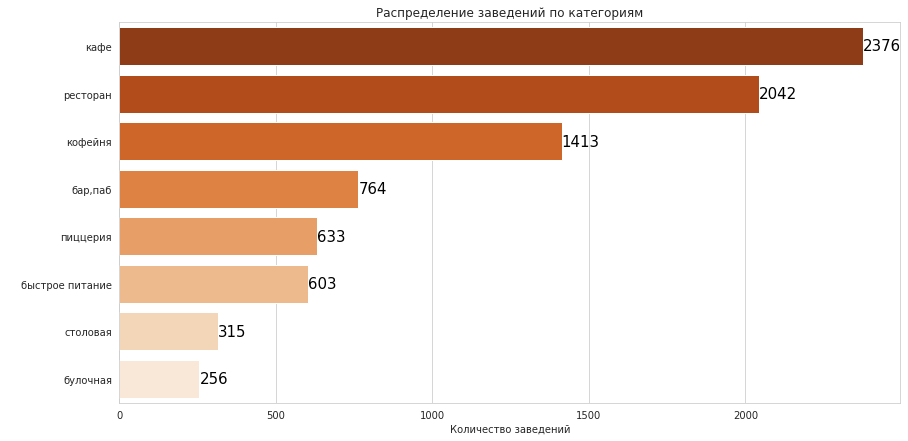

In [13]:
#fig = go.Figure(data = [go.Pie(labels = fd_category['category'], 
                               #values = fd_category['values'], 
                               #pull = [0.03], 
                               #marker = dict(colors = px.colors.sequential.Oranges), textinfo='label+value+percent')])

#fig.update_traces(textposition = 'inside', textfont = dict(color = 'black', size = 12))

#fig.update_layout(title = 'Распределение заведений по категориям',
                  #title_x = 0.21,
                 #width = 800,
                  #height = 800,
                  #legend_title_text = 'Категория')
                
plt.figure(figsize=(14, 7))
ax = sns.barplot(data=fd_category, x='values', y='category', palette='Oranges_r')
plt.title('Распределение заведений по категориям')
plt.xlabel('Количество заведений')
plt.ylabel(' ')

for p in ax.patches:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy() 
    ax.annotate(f'{width:.0f}', 
                (x + width + 0.1, y + height / 2),
                ha='left', va='center', color='black', fontsize=15)

plt.show()

**Вывод:**

Больше всего в датасете заведений категории Кафе - 2378 заведений (28.3%), на втором месте Рестораны - 2043 заведения (24.3%), замыкает тройку Кофейни с 1413 заведениями (16.8%). Наименьшее число заведений представленно 2-мя категориями: Столовая - 315 заведений (3.75%) и Булочная - 256 заведений (3.05%).

<h4>Анализ и визуализация количества посадочных мест в заведениях общественного питания по категориям</h4>

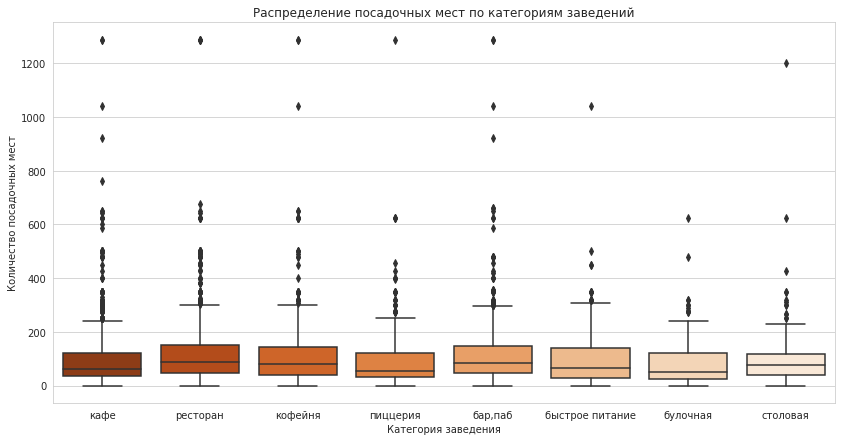

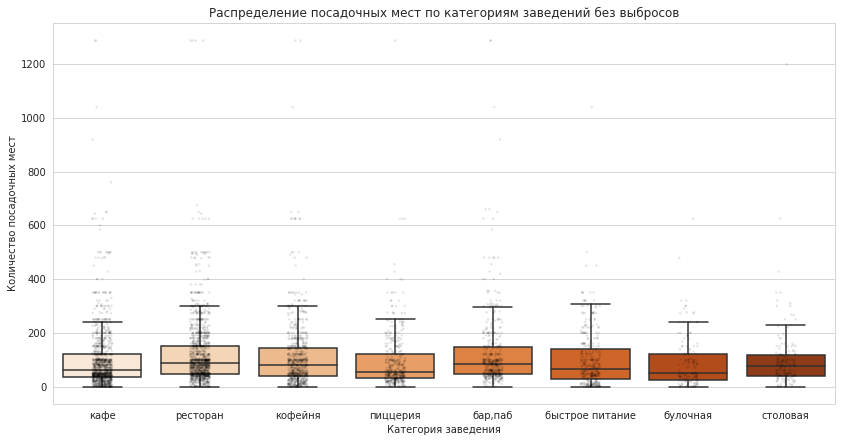

In [14]:
plt.figure(figsize = (14, 7))
sns.boxplot(data = fd, x = 'category', y = 'seats', palette='Oranges_r')
plt.title('Распределение посадочных мест по категориям заведений')
plt.xlabel('Категория заведения')
plt.ylabel('Количество посадочных мест')
plt.show()

plt.figure(figsize = (14, 7))
ax = sns.boxplot(data = fd, x = 'category', y = 'seats', showfliers = False, palette='Oranges')
ax = sns.stripplot(x='category', y='seats', data=fd, color="black", jitter=0.1, size=2.5, alpha=0.1)
plt.title('Распределение посадочных мест по категориям заведений без выбросов')
plt.xlabel('Категория заведения')
plt.ylabel('Количество посадочных мест')
plt.show()

In [15]:
median_seats = (fd
                .pivot_table(index = 'category', values = 'seats', aggfunc = 'median')
                .sort_values(by = 'seats', ascending = False)
                .reset_index()
                .rename(columns = {'seats': 'median_seats'})
               )

median_seats = median_seats.sort_values(by = 'median_seats', ascending = False)
median_seats

,category,median_seats
0,ресторан,86.0
1,"бар,паб",82.0
2,кофейня,80.0
3,столовая,75.5
4,быстрое питание,65.0
5,кафе,60.0
6,пиццерия,55.0
7,булочная,50.0


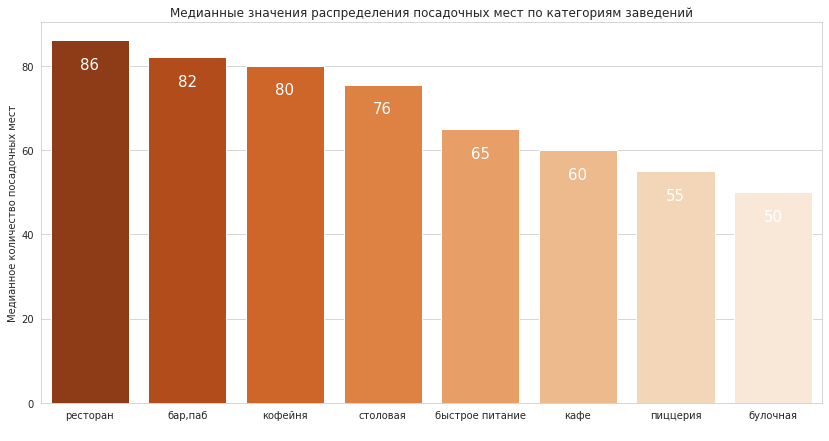

In [16]:
plt.figure(figsize = (14, 7))
ax = sns.barplot(data = median_seats, x = 'category', y = 'median_seats', palette = 'Oranges_r')
plt.title('Медианные значения распределения посадочных мест по категориям заведений')
plt.xlabel(' ')
plt.ylabel('Медианное количество посадочных мест')

# Подписи медианных значений в столбцах
for p in ax.patches:
    ax.annotate(f'{p.get_height():.0f}',
                (p.get_x() + p.get_width() / 2., p.get_height() - 4),
                ha = 'center', va = 'top', color = 'white', fontsize = 15)

plt.show()

**Вывод:**

* Рестораны, бары, кофейни и столовые ориентированы на более массовую аудиторию. Они созданы для приема большего числа гостей.
* Заведения быстрого питания, пиццерии, кафе и булочные более ориентированы на быстрые перекусы, вынос заказов или более компактное размещение клиентов.

<h4>Анализ и визуализация соотношения сетевых и несетевых заведений в датасете</h4>

In [17]:
fig = go.Figure(data = [go.Pie(labels = fd['chain'].reset_index(),
                               values = fd['chain'].value_counts(),
                               pull = [0.03],)]
               )

fig.update_traces(marker = dict(colors = px.colors.sequential.Oranges),
                  textinfo = 'label+value+percent',
                  textposition = 'inside',
                  textfont = dict(color = 'black', size = 15),
                  labels = ['Несетевые заведения', 'Сетевые заведения']
                 )        

fig.update_layout(title = 'Соотношение сетевых и несетевых заведений',
                  width = 800,
                  height = 800,
                  title_x = 0.2,
                  legend_title_text = 'Категория'
                 )
fig.show() 

**Вывод:**

Доля сетевых заведений в выборке 38.1% (3205 заведений), несетевых заведений больше - 61.9% (5201 заведение).

<h4>Анализ и визуализация категорий заведений с наибольшей долей сетевых объектов</h4>

In [18]:
chain_catering = (fd
                  .groupby('category')['chain']
                  .agg(['sum', 'count'])
                  .reset_index()
                 )

chain_catering.columns = ['category', 'chain', 'total']
chain_catering['non_chain'] = chain_catering['total'] - chain_catering['chain']
chain_catering = chain_catering.sort_values(by = 'chain', ascending = False)
chain_catering.reset_index(drop = True)

,category,chain,total,non_chain
0,кафе,779,2376,1597
1,ресторан,729,2042,1313
2,кофейня,720,1413,693
3,пиццерия,330,633,303
4,быстрое питание,232,603,371
5,"бар,паб",168,764,596
6,булочная,157,256,99
7,столовая,88,315,227


In [19]:
fig = px.bar(chain_catering, 
             x = 'category', 
             y = ['chain', 'non_chain'],
             barmode='group',
             labels = {'category': 'Категория заведения', 'value': 'Количество заведений'},
             color_discrete_sequence = px.colors.sequential.Oranges
            )

fig.update_traces(texttemplate = '%{value:.0f}',
                  textfont = dict(color='black', size=15),
                  textposition = 'inside'
                 )

fig.for_each_trace(lambda t: t.update(name='Сетевые заведения' if t.name == 'chain' else 'Несетевые заведения'))

fig.update_layout(width = 1000,
                  height = 500,
                  plot_bgcolor = 'rgba(0,0,0,0)',
                  title = 'Количество сетевых и несетевых заведений по категориям',
                  title_x = 0.2,
                  legend_title_text = 'Тип заведения'
                 )

fig.show()

**Вывод:**

Несетевых заведений в два раза больше, чем сетевых.
Наиболее часто сетевыми являются следующие категории заведений:
* Кафе - 779 заведений
* Ресторан - 730 заведений
* Кофейня - 720 заведений

Интересно что, доля сетевых заведений в группах кофейня, пицерия, булочная составляет более 50% от общего числа заведений в выборке. Сетевые модели позволяют легко тиражировать успешные концепции, обеспечивая стандартизированное качество продукции и сервиса. 

<h4>Анализ и визуализация топ-15 популярных сетевых заведений в Москве по количеству объектов</h4>

In [20]:
top_catering = (
     fd[fd['chain'] == 1]
    .groupby(['category', 'name'])['chain']
    .count()
    .reset_index(name = 'count')
    .sort_values(by = 'count', ascending = False)
    .head(15)
)

top_catering.reset_index(drop = True)

,category,name,count
0,кофейня,шоколадница,119
1,пиццерия,домино'с пицца,76
2,пиццерия,додо пицца,74
3,кофейня,one price coffee,71
4,ресторан,яндекс лавка,69
5,кофейня,cofix,65
6,ресторан,prime,49
7,кофейня,кофепорт,42
8,кафе,кулинарная лавка братьев караваевых,39
9,ресторан,теремок,36


In [21]:
fig = px.sunburst(top_catering, 
                  path = ['category', 'name'],
                  values='count',
                  width = 800,
                  height = 800,
                  hover_data = ['count'],
                  color_discrete_sequence = px.colors.sequential.Oranges
                 )

fig.update_layout(title_text = ' Топ-15 популярных сетей в Москве по категориям',
                  title_x = 0.5
                 )

fig.update_traces(texttemplate = '%{label}<br>заведений: %{value:.0f}')

fig.show()

**Вывод:**

В топ-15 популярных сетевых заведений в Москве по количеству объектов вошли заведения из категорий Кофейня (сумарно 350 заведений), Рестораны (154 заведения), Пиццерии (150 заведений), Кафе (89 заведений) и сеть булочных - Буханка (25 заведений).
Самая большая сеть в Москве у кофейни Шоколадница - 119 заведений.

Все перечисленные сети - это в основном федеральные или даже международные бренды, которые работают по франчайзинговой модели. Это позволяет им быстро расширяться и охватывать больше аудитории.

Вопрос вызывает "Яндекс Лавка"  - это скорее сервис доставки еды и продуктов, который также предлагает готовую еду, чем ресторан.

<h4>Анализ и визуализация административных районов Москвы: общее количество заведений и их распределение по категориям</h4>

In [22]:
fd['dstrct'] = fd['district'].replace(
    {'Северный административный округ': 'САО',
     'Северо-Восточный административный округ': 'СВАО',
     'Северо-Западный административный округ': 'СЗАО',
     'Западный административный округ': 'ЗАО',
     'Центральный административный округ': 'ЦАО',
     'Восточный административный округ': 'ВАО',
     'Юго-Восточный административный округ': 'ЮВАО',
     'Южный административный округ': 'ЮАО',
     'Юго-Западный административный округ': 'ЮЗАО'}
    )

In [23]:
# Подсчет количества заведений каждой категории по районам
district_category_counts = (fd
                            .groupby(['dstrct', 'category'])['name']
                            .count()
                            .reset_index(name = 'count')
                           )
heatmap_data = district_category_counts.pivot(index = 'dstrct', columns = 'category', values = 'count')
heatmap_data['всего'] = heatmap_data.sum(axis = 1)

In [24]:
heatmap_data

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,всего
dstrct,,,,,,,,,
ВАО,53,25,71,272,105,72,160,40,798
ЗАО,50,37,62,238,150,71,218,24,850
САО,68,39,58,234,193,77,188,41,898
СВАО,62,28,82,269,159,68,182,40,890
СЗАО,23,12,30,115,62,40,109,18,409
ЦАО,364,50,87,464,428,113,670,66,2242
ЮАО,68,25,85,264,131,73,202,44,892
ЮВАО,38,13,67,282,89,55,145,25,714
ЮЗАО,38,27,61,238,96,64,168,17,709


In [25]:
heatmap_data['всего'].sum()

8402

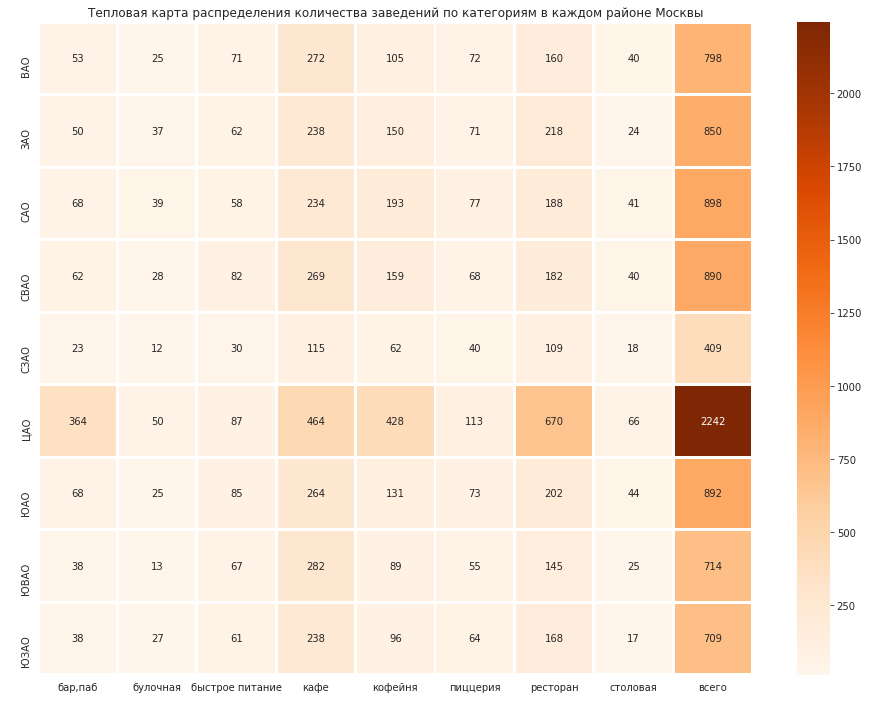

In [26]:
plt.figure(figsize = (16, 12))
sns.heatmap(heatmap_data, annot = True, linewidths = 2, cmap = 'Oranges', fmt = 'd')
plt.title('Тепловая карта распределения количества заведений по категориям в каждом районе Москвы')
plt.xlabel(' ')
plt.ylabel(' ')

plt.show()

**Вывод:**

Центральный административный округ (ЦАО) явно выделяется по количеству заведений. Это говорит о том, что Центральный административный округ является наиболее привлекательным районом для открытия бизнеса в сфере общественного питания. 

Северо-Западный административный округ (СЗАО) отличается от других округов Москвы более низкой концентрацией заведений общественного питания. СЗАО отличатется по демографическим характеристикам от других округов, более низкой плотностью  населения. 

Распределение по категориям:

* Рестораны: в ЦАО наблюдается самое большое количество ресторанов, что соответствует его престижному статусу и большому  количеству туристов. 
* Кофейни: ЦАО также лидирует по количеству кофеен, что подчеркивает популярность этого формата в центре города.
* Кафе: по количеству кафе ЦАО также превосходит другие округа.
* Быстрое питание: в Северо-Восточном и Южном округах наблюдается значительное количество заведений быстрого питания.
* Бар,паб: в ЦАО также самое большое количество баров/пабов, активная ночная жизнь в центре города.

<h4>Визуализация распределения средних рейтингов по категориям заведений</h4>

In [27]:
mean_rating = (fd
               .pivot_table(index = 'category', values = 'rating', aggfunc = 'mean')
               .sort_values(by = 'rating', ascending = False)
               .round(2)
               .reset_index()
              )

mean_rating

,category,rating
0,"бар,паб",4.39
1,пиццерия,4.30
2,ресторан,4.29
3,кофейня,4.28
4,булочная,4.27
5,столовая,4.21
6,кафе,4.12
7,быстрое питание,4.05


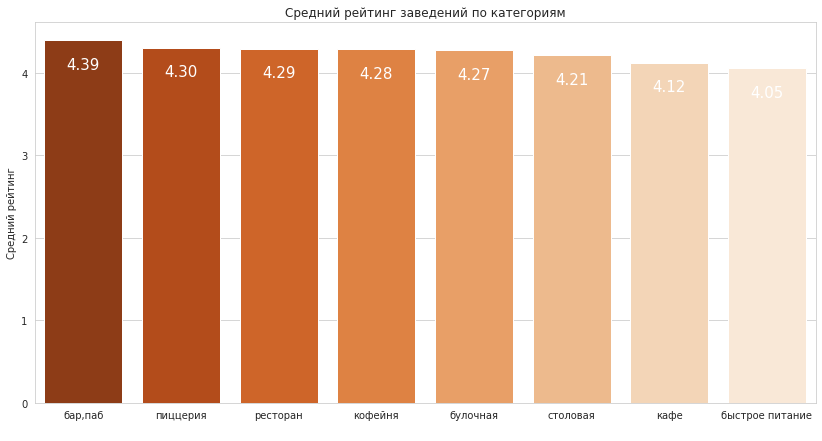

In [28]:
plt.figure(figsize = (14, 7))
ax = sns.barplot(data = mean_rating, x = 'category', y = 'rating', palette='Oranges_r')
plt.title('Средний рейтинг заведений по категориям')
plt.xlabel(' ')
plt.ylabel('Средний рейтинг')

# Подписи средних значений в столбцах
for p in ax.patches:
    ax.annotate(f'{p.get_height():.2f}',
                (p.get_x() + p.get_width() / 2., p.get_height() - 0.2),
                ha = 'center', va = 'top', color = 'white', fontsize = 15)

plt.show()

**Вывод:**

Усреднённые рейтинги в разных типах общепита различаются, но не сильно. 

Разница между максимальным и минимальным рейтингом составляет всего 0.34 балла (4.39 - 4.05). 

* Самые высокие рейтинги: у баров/пабов, пиццерий и ресторанов (4.39, 4.30, 4.29).
* Средний уровень: у кофеен и булочных (4.28, 4.27).
* Самые низкие рейтинги: у столовых, кафе и быстрого питания (4.21, 4.12, 4.05).

<h4>Визуализация среднего рейтинга заведений по административным районам Москвы</h4>

In [29]:
district_rating = (fd
                   .groupby('dstrct')['rating']
                   .agg('mean')
                   .round(2)
                   .reset_index()
                  )

district_rating = district_rating.sort_values(by = 'rating', ascending = False).reset_index(drop=True)
district_rating

,dstrct,rating
0,ЦАО,4.38
1,САО,4.24
2,СЗАО,4.21
3,ЗАО,4.18
4,ЮАО,4.18
5,ВАО,4.17
6,ЮЗАО,4.17
7,СВАО,4.15
8,ЮВАО,4.10


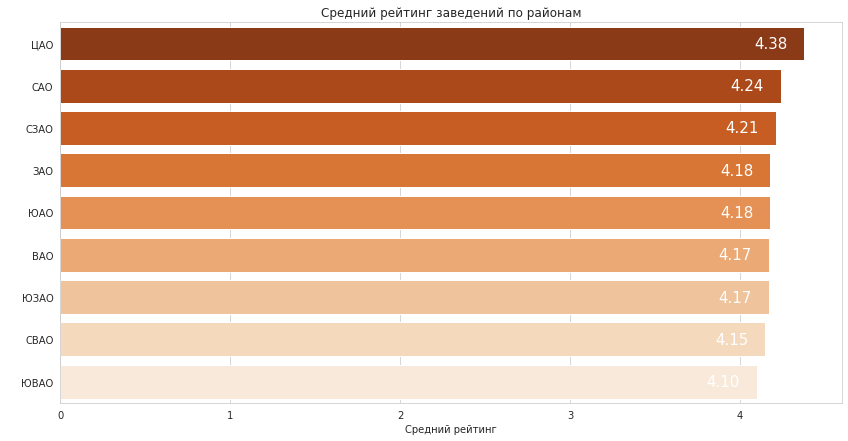

In [30]:
plt.figure(figsize = (14, 7))
ax = sns.barplot(data = district_rating, x = 'rating', y = 'dstrct', palette='Oranges_r')
plt.title('Средний рейтинг заведений по районам')
plt.xlabel('Средний рейтинг')
plt.ylabel(' ')

# Подписи средних значений в столбцах
for p in ax.patches:
    ax.annotate(f'{p.get_width():.2f}',
                (p.get_width() - 0.1, p.get_y() + p.get_height() / 2),
                ha = 'right', va = 'center', color = 'white', fontsize=15)

plt.show()

In [31]:
district_rating_m = (fd
                   .groupby('district')['rating']
                   .agg('mean')
                   .round(2)
                   .reset_index()
                  )

district_rating_m = district_rating_m.sort_values(by = 'rating', ascending = False).reset_index(drop=True)
district_rating_m

,district,rating
0,Центральный административный округ,4.38
1,Северный административный округ,4.24
2,Северо-Западный административный округ,4.21
3,Западный административный округ,4.18
4,Южный административный округ,4.18
5,Восточный административный округ,4.17
6,Юго-Западный административный округ,4.17
7,Северо-Восточный административный округ,4.15
8,Юго-Восточный административный округ,4.10


In [32]:
# Загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# Создаём карту Москвы
m = folium.Map(location = [moscow_lat, moscow_lng], zoom_start = 10, tiles = 'Cartodb Positron')

# Создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
choropleth = folium.Choropleth(
    geo_data = state_geo,
    data = district_rating_m,
    columns = ['district', 'rating'],
    key_on = 'feature.properties.name',
    fill_color = 'Oranges',
    fill_opacity = 0.5,
    legend_name = 'Средний рейтинг заведений по районам',
).add_to(m)

choropleth.geojson.add_child(folium.features.GeoJsonTooltip(
    fields = ['name'],
    aliases = ['Район:'],
    labels = True,
    localize = True,
    sticky = False)
                            )

m

**Вывод:**

Центральный административный округ (ЦАО) отличается наиболее высоким средним рейтингом (4.38), что может говорить о более высоком уровне качества обслуживания и удовлетворенности клиентов в заведениях этого округа. Северный административный округ (САО) и Северо-Западный административный округ (СЗАО) также имеют относительно высокие рейтинги (4.24 и 4.21 соответственно).

Самый низкий средний рейтинг в Юго-Восточном административном округе (4.10)

<h4>Визуализация всех заведений из датасета на карте с использованием кластеров</h4>

In [33]:
mc = folium.Map(location = [moscow_lat, moscow_lng], zoom_start = 10, tiles = 'Cartodb Positron')

marker_cluster = MarkerCluster().add_to(mc)

choropleth = folium.Choropleth(
    geo_data = state_geo,
    key_on = 'feature.properties.name',
    fill_color = 'Oranges',
    fill_opacity = 0.01,
    ).add_to(mc)

# Создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup = f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# Применяем функцию create_clusters() к каждой строке датафрейма
fd.apply(create_clusters, axis=1)

choropleth.geojson.add_child(folium.features.GeoJsonTooltip(
    fields = ['name'],
    aliases = ['Район:'],
    labels = True,
    localize = True,
    sticky = False)
                            )

mc

ЦАО - это сердце Москвы, где история, культура, экономика и современность сплетаются воедино. Он привлекает как жителей, так и туристов своим богатым наследием, развитой инфраструктурой, и разнообразными предложениями на рынке услуг. 

* В ЦАО наблюдается самая высокая концентрация заведений в сравнении с другими округами. ЦАО является центром деловой активности и туризма, где существует большой спрос на услуги общественного питания и развлечений. 
* ЦАО демонстрирует наибольшее разнообразие типов заведений: от ресторанов и баров, кафе, пиццерий до столовых и мест быстрого питания. ЦАО предлагает широкий выбор услуг, удовлетворяя потребности разных групп населения и гостей города. 
* В ЦАО сосредоточено большое количество известных ресторанных сетей, что свидетельствует о высоком уровне покупательской способности и спросе на качественные услуги. 
* Высокая концентрация заведений в ЦАО, обуславливает высокую конкуренцию, что может стимулировать развитие качества услуг и сервиса.
* ЦАО отличается удобным транспортным сообщением - здесь проходят основные линии метро, много автобусных маршрутов, что делает его удобным для передвижения.
* В ЦАО есть множество парков и зеленых зон, которые создают комфортную среду для жизни и отдыха.

**Вывод:**

По мере удаления от центра количество заведений снижается.


<h4>Визуализация распределения категорий и количества объектов на топ-15 улиц по количеству заведений</h4>

In [34]:
# Определяем топ-15 улиц
top_15_streets = fd['street'].value_counts().nlargest(15).index
street_index = fd[fd['street'].isin(top_15_streets)]
heatmap_data2 = street_index.groupby(['street', 'category'])['name'].count().unstack(fill_value=0)
heatmap_data2['всего'] = heatmap_data2.sum(axis=1)

heatmap_data2

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,всего
street,,,,,,,,,
варшавское шоссе,6,0,7,18,14,4,20,7,76
дмитровское шоссе,6,2,10,23,11,8,24,4,88
каширское шоссе,2,0,10,20,16,5,19,5,77
кутузовский проспект,2,1,2,14,13,3,16,3,54
ленинградский проспект,15,4,2,12,25,9,25,3,95
ленинградское шоссе,5,2,5,13,13,3,26,3,70
ленинский проспект,10,3,2,26,23,5,33,5,107
люблинская улица,5,0,5,26,11,1,10,2,60
мкад,1,0,9,45,4,0,5,1,65


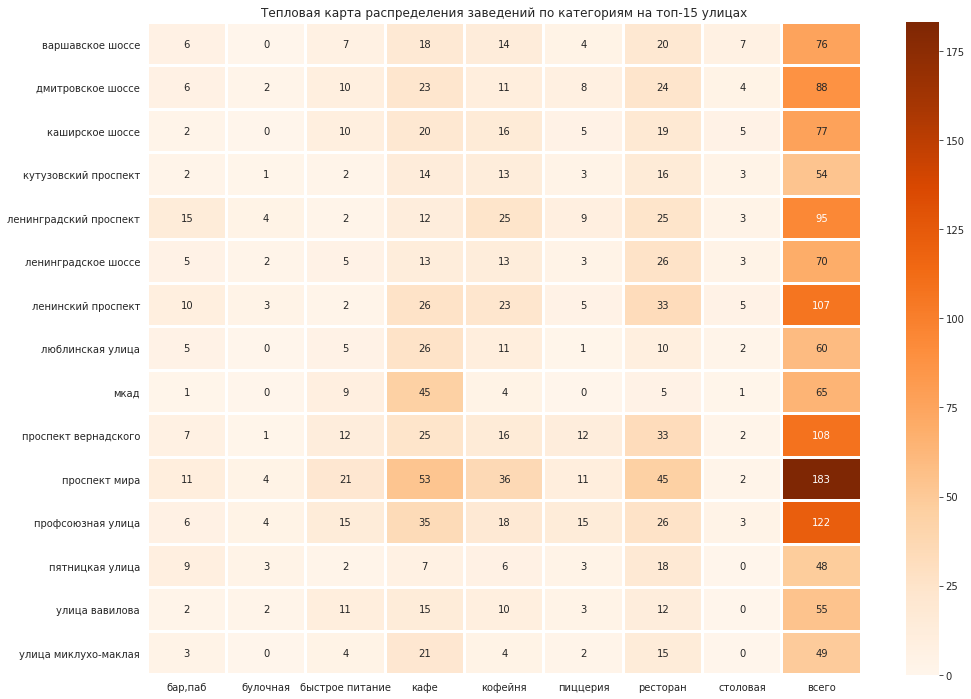

In [35]:
# Строим тепловую карту
plt.figure(figsize = (16, 12))
sns.heatmap(heatmap_data2, annot = True, linewidths = 2, cmap = 'Oranges', fmt = 'd')
plt.xlabel('')
plt.ylabel('')
plt.title('Тепловая карта распределения заведений по категориям на топ-15 улицах')
plt.show()

**Вывод:**

Лидирует Проспект Мира (184 заведения): является одним из самых популярных и проходных мест в Москве, что объясняет большое количество заведений. Наиболее популярные улицы расположены в центральных и западных районах Москвы, где наблюдается более высокая плотность населения и развитая инфраструктура.

<h4>Анализ и визуализация улиц с единственными заведениями общественного питания</h4>

In [36]:
obj_counts = fd.groupby('street')['name'].count()
single_obj_streets = obj_counts[obj_counts == 1].index
single_obj = fd[fd['street'].isin(single_obj_streets)]

single_obj.sample(10)

,name,category,address,street,district,hours,is_24_7,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,dstrct
3728,dobryakova bakery,кафе,"москва, малый кисловский переулок, 9, стр. 1",малый кисловский переулок,Центральный административный округ,"ежедневно, 10:00–21:00",False,55.756125,37.602316,4.4,NaN,NaN,NaN,NaN,0,40.0,ЦАО
7424,пончики,кафе,"москва, парк имени артёма боровика",парк имени артёма боровика,Юго-Восточный административный округ,"ежедневно, 10:00–21:00",False,55.661207,37.756636,4.1,средние,Средний счёт:200–450 ₽,325.0,NaN,1,NaN,ЮВАО
7858,достонжон,кафе,"москва, ступинский проезд, 1а, стр. 4",ступинский проезд,Южный административный округ,ср 08:00–20:00,False,55.592490,37.628308,4.0,NaN,NaN,NaN,NaN,0,NaN,ЮАО
5882,фитнес кафе fresh fit,ресторан,"москва, улица кутузова, 11, корп. 2",улица кутузова,Западный административный округ,"ежедневно, 09:00–21:30",False,55.723263,37.412137,4.5,NaN,NaN,NaN,NaN,0,NaN,ЗАО
3162,арт-кафе сахар,кафе,"москва, промышленный проезд, 8",промышленный проезд,Западный административный округ,пн-пт 09:00–18:00,False,55.741257,37.509202,4.3,выше среднего,Средний счёт:1000–1500 ₽,1250.0,NaN,0,NaN,ЗАО
3575,bowlroom,ресторан,"москва, сытинский переулок, 4",сытинский переулок,Центральный административный округ,"ежедневно, 10:00–23:00",False,55.764136,37.602346,4.5,средние,Средний счёт:от 800 ₽,800.0,NaN,0,NaN,ЦАО
553,донер тандыр,быстрое питание,"москва, проезд донелайтиса, 23",проезд донелайтиса,Северо-Западный административный округ,"ежедневно, 10:00–22:00",False,55.846526,37.418447,4.4,NaN,NaN,NaN,NaN,0,NaN,СЗАО
3126,яндекс лавка,ресторан,"москва, полоцкая улица, 2",полоцкая улица,Западный административный округ,"ежедневно, 07:00–00:00",False,55.728646,37.424947,2.8,NaN,NaN,NaN,NaN,1,NaN,ЗАО
2281,кофепорт,кофейня,"москва, орловский переулок, 7",орловский переулок,Центральный административный округ,"ежедневно, 08:00–22:00",False,55.786007,37.625645,4.3,NaN,Цена чашки капучино:90–100 ₽,NaN,95.0,1,NaN,ЦАО
959,марина,ресторан,"москва, улица вешних вод, 8, корп. 2",улица вешних вод,Северо-Восточный административный округ,"ежедневно, 11:00–23:00",False,55.859331,37.699241,3.8,низкие,Средний счёт:150–200 ₽,175.0,NaN,0,90.0,СВАО


In [37]:
single_obj_grouped = (single_obj
                .groupby(['dstrct', 'category'])['name']
                .count()
                .reset_index(name='count')
               )

fig = px.bar(
    single_obj_grouped,
    x = 'count',
    y = 'dstrct',
    color = 'category',
    labels = {'dstrct': 'Район', 'count': 'Количество заведений'},
    color_discrete_sequence = px.colors.sequential.Oranges
            )

fig.update_layout(width = 1000,
                  height = 500,
                  plot_bgcolor = 'rgba(0,0,0,0)',
                  title = 'Улицы с одним заведением с разбивкой по районам и категориям заведений',
                  title_x = 0.2,
                  legend_title_text = 'Категория'
                 )
fig.show()

**Вывод:**

На улицах с 1-м объектом общепита расположены разнообразные заведения - бары, быстрое питание, рестораны, кафе и др. Улицы скорее всего небольшие, так как основная часть заведений распологается в центре, с очень плотной застройкой и множеством проездов и переулков.

<h4>Анализ и визуализация медианы средних чеков заведений по районам</h4>

In [38]:
avg_bill = (fd
            .pivot_table(index = 'district', values = 'middle_avg_bill', aggfunc = 'median')
            .sort_values(by = 'middle_avg_bill', ascending = False)
            .reset_index()
           )
avg_bill

,district,middle_avg_bill
0,Западный административный округ,1000.0
1,Центральный административный округ,1000.0
2,Северо-Западный административный округ,700.0
3,Северный административный округ,650.0
4,Юго-Западный административный округ,600.0
5,Восточный административный округ,575.0
6,Северо-Восточный административный округ,500.0
7,Южный административный округ,500.0
8,Юго-Восточный административный округ,450.0


In [39]:
mbill = folium.Map(location = [moscow_lat, moscow_lng], zoom_start = 10, tiles = 'Cartodb Positron')

Choropleth(
    geo_data = state_geo,
    data = avg_bill,
    columns = ['district', 'middle_avg_bill'],
    key_on = 'feature.properties.name',
    fill_color = 'Oranges',
    fill_opacity = 0.5,
    legend_name = 'Медианный чек заведений по районам',
).add_to(mbill)
       
choropleth.geojson.add_child(folium.features.GeoJsonTooltip(
    fields = ['name'],
    aliases = ['Район:'],
    labels = True,
    localize = True,
    sticky = False)
                            )    
    
mbill

**Вывод:**

Анализ данных показывает, что средний чек в Центральном и Западном административных округах составляет 1000 рублей, что выше, чем в других округах. В Юго-Восточном, Северо-Восточном и Южном административных округах, средний чек в районе 500 рублей.

<h4>Анализ и визуализация часов работы заведений в зависимости от расположения и категории</h4>

In [40]:
print('Рассмотрим графики работы и колличество заведений:\n')
print(fd['hours'].value_counts())

Рассмотрим графики работы и колличество заведений:

ежедневно, 10:00–22:00                                                                      758
ежедневно, круглосуточно                                                                    730
ежедневно, 11:00–23:00                                                                      396
ежедневно, 10:00–23:00                                                                      310
ежедневно, 12:00–00:00                                                                      254
                                                                                           ... 
пн-пт 08:00–00:00                                                                             1
ежедневно, 11:00–22:50                                                                        1
пн-пт 09:00–21:00; сб 11:00–22:00; вс 12:00–22:00                                             1
ежедневно, 08:00–05:00                                                              

Возьмём 2 самые многочисленные категории заведений: `ежедневно, 10:00–22:00` и `ежедневно, круглосуточно`.

In [41]:
all_day_24 = fd.query('is_24_7 == True')
all_day_10_22 = fd.query("hours == 'ежедневно, 10:00–22:00'")

m24 = folium.Map(location=[moscow_lat, moscow_lng], zoom_start = 10, tiles = 'Cartodb Positron')

marker_cluster = MarkerCluster().add_to(m24)

choropleth = folium.Choropleth(
    geo_data = state_geo,
    data = all_day_24,
    columns = ['district', 'is_24_7'],
    fill_color = 'PuBu',
    fill_opacity = 0.01,
    legend_name = 'Распределение круглосуточных заведений по районам Москвы',
).add_to(m24)

choropleth.geojson.add_child(folium.features.GeoJsonTooltip(
    fields = ['name'],
    aliases = ['Район:'],
    labels = True,
    localize = True,
    sticky = False)
                            )

all_day_24.apply(create_clusters, axis=1)

m24

In [42]:
fig = go.Figure(data = [go.Pie(labels = all_day_24['category'],
                               values = all_day_24['category'].value_counts(),
                               pull = [0.03],)]
               )

fig.update_traces(marker = dict(colors = px.colors.sequential.Oranges),
                  textinfo = 'label+value+percent',
                  textposition = 'inside',
                  textfont = dict(color = 'black', size = 15),                  
                 )      

fig.update_layout(title = 'Соотношение категорий круглосуточных заведений',
                  width = 800,
                  height = 800,
                  title_x = 0.5,
                  legend_title_text = 'Категория'
                 )
fig.show() 

**Вывод:**

Наибольшая концентрация круглосуточных заведений в центре Москвы (ЦАО). Среди категорий круглосуточных заведений выделяются бары и пабы - 267 заведений (36.6%), рестораны - 162 заведения (22.2%) и на удивление булочная - 135 заведений (18.5%). 

In [43]:
m10 = folium.Map(location=[moscow_lat, moscow_lng], zoom_start = 10, tiles = 'Cartodb Positron')

marker_cluster = MarkerCluster().add_to(m10)

choropleth = folium.Choropleth(
    geo_data = state_geo,
    data = all_day_10_22,
    columns = ['district', 'hours'],
    fill_color = 'PuBu',
    fill_opacity = 0.01,
    legend_name = 'Распределение заведений с графиком ежедневно, 10:00–22:00 по районам Москвы',
).add_to(m10)

choropleth.geojson.add_child(folium.features.GeoJsonTooltip(
    fields = ['name'],
    aliases = ['Район:'],
    labels = True,
    localize = True,
    sticky = False)
                            )

all_day_10_22.apply(create_clusters, axis=1)

m10

In [44]:
fig = go.Figure(data = [go.Pie(labels = all_day_10_22['category'],
                               values = all_day_10_22['category'].value_counts(),
                               pull = [0.03],)]
               )

fig.update_traces(marker = dict(colors = px.colors.sequential.Oranges),
                  textinfo = 'label+value+percent',
                  textposition = 'inside',
                  textfont = dict(color = 'black', size = 15),                  
                 )      

fig.update_layout(title = 'Соотношение категорий заведений c графиком ежедневно, 10:00–22:00',
                  width = 800,
                  height = 800,
                  title_x = 0.5,
                  legend_title_text = 'Категория'
                 )
fig.show() 

**Вывод:**

Среди заведений c графиком работы `ежедневно, 10:00–22:00'` больше всего ресторанов - 312 заведений (41.1%), кафе - 292 заведения (38.5%) и пиццерии - 144 заведения (19%). Расположены они в основном в Центральном, Северном и Северо-Восточном административных округах.

<h4>Анализ и визуализация заведений с плохими рейтингом в зависимости от расположения и категории</h4>

In [45]:
low_rating = fd.query('rating <= 3.0')

mlr = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

marker_cluster = MarkerCluster().add_to(mlr)

choropleth = folium.Choropleth(
    geo_data = state_geo,
    data = all_day_24,
    columns = ['district', 'is_24_7'],
    fill_color = 'Oranges',
    fill_opacity = 0.01,
    legend_name = 'Распределение заведений c низким рейтингом по районам Москвы',
).add_to(mlr)

choropleth.geojson.add_child(folium.features.GeoJsonTooltip(
    fields = ['name'],
    aliases = ['Район:'],
    labels  =True,
    localize = True,
    sticky = False)
                            )

low_rating.apply(create_clusters, axis=1)

mlr

In [46]:
fig = go.Figure(data = [go.Pie(labels = low_rating['category'],
                               values = low_rating['category'].value_counts(),
                               pull = [0.03],)]
               )

fig.update_traces(marker = dict(colors = px.colors.sequential.Oranges),
                  textinfo = 'label+value+percent',
                  textposition = 'inside',
                  textfont = dict(color = 'black', size = 15)                                   
                 )        

fig.update_layout(title = 'Соотношение категорий заведений c низким рейтингом',
                  width = 800,
                  height = 800,
                  title_x = 0.5,
                  legend_title_text = 'Категория'
                 )
fig.show()

**Вывод:**

Заведений с низким рейтингом в центре практически нет, видимо из-за высокой конкуренции и стоимости аренды. В остальных районах такие заведения присутствуют. Чаще всего низкий рейтинг имеют кафе, рестораны быстрого питания и пиццерии. Реже пабы/бары и кофейни.

**Промежуточный вывод:**
* В Москве наиболее популярными категориями заведений общественного питания являются кафе (2378), рестораны (2043) и кофейни (1413). 
* Сетевые заведения составляют 38.1% от общего числа (3205 заведений), среди которых лидируют кафе (779), рестораны (730) и кофейни (720).
* Центральный административный округ (ЦАО) выделяется наибольшим количеством заведений и высоким средним рейтингом заведений (4.38).
* Наиболее высокие рейтинги у баров и пабов (4.39), пиццерий (4.30), самые низкие - у кафе и заведений быстрого питания (4.12 и 4.05). 
* Средний чек выше в ЦАО и Западном округе (1000 руб.), ниже в Юго-Восточном и Северо-Восточном (около 500 руб.). 
* В центре Москвы (ЦАО) сосредоточено наибольшее количество круглосуточных заведений, среди которых преобладают бары, пабы и рестораны.  Также неожиданно популярны круглосуточные булочные.  Среди заведений, работающих с 10:00 до 22:00, лидируют рестораны, кафе и пиццерии, преимущественно в Центральном, Северном и Северо-Восточном округах.  
* В центре практически нет заведений с низким рейтингом, вероятно, из-за высокой конкуренции и стоимости аренды.

### Детализация исследования: открытие кофейни

<h4>Количество кофеен в датасете и их распределение по районам</h4>

In [47]:
coffee = (fd.query('category == "кофейня"')
          .pivot_table(index = 'district', values = 'name', aggfunc = 'count')
          .reset_index()
          .sort_values(by = 'name', ascending = False)
          .rename(columns = {'name': 'count'})
         )

coffee['percent'] = ((coffee['count'] / coffee['count'].sum()) * 100).round(2)

display(coffee.reset_index(drop = True))

print('Количество кофеен в датасете:', coffee['count'].sum())

,district,count,percent
0,Центральный административный округ,428,30.29
1,Северный административный округ,193,13.66
2,Северо-Восточный административный округ,159,11.25
3,Западный административный округ,150,10.62
4,Южный административный округ,131,9.27
5,Восточный административный округ,105,7.43
6,Юго-Западный административный округ,96,6.79
7,Юго-Восточный административный округ,89,6.30
8,Северо-Западный административный округ,62,4.39


Количество кофеен в датасете: 1413


In [48]:
m_coff = folium.Map(location=[moscow_lat, moscow_lng], zoom_start = 10, tiles = 'Cartodb Positron')

choropleth = folium.Choropleth(
    geo_data = state_geo,
    data = coffee,
    columns = ['district', 'count'],
    key_on = 'feature.properties.name',
    fill_color = 'Oranges',
    fill_opacity = 0.5,
    legend_name = 'Распределение кофеен по районам',
).add_to(m_coff)

choropleth.geojson.add_child(folium.features.GeoJsonTooltip(
    fields = ['name'],
    aliases = ['Район:'],
    labels = True,
    localize = True,
    sticky = False)
)

m_coff

**Вывод:**

Больше всего кофеен расположено в Центральном административном округе - 428 (30.29%), далее по количеству кофеен следуют Северный (13.66%), Северо-Восточный (11.25%) и Западный (10.62%) административные округа соответственно. Меньше всего заведений в Северо-Западном административном округе - 62 (4.39%).

Центр Москвы (ЦАО) — это деловой, культурный и туристический центр, где сконцентрированы офисы, магазины и культурные объекты. Это создает постоянный поток людей, что обеспечивает кофейням высокий спрос на их услуги, поэтому их количество в центре самое большое.


<h4>Количество круглосуточных кофеен</h4>

In [49]:
print('Количество кофеен в датасете:', fd[(fd['category'] == "кофейня")].shape[0])   
print()
print('Рассмотрим графики работы кофеен:\n')
ct = fd.query('category == "кофейня"')
print(ct['hours'].value_counts())
print()
print('Кофейни с графиком работы 24/7:', fd[(fd['category'] == "кофейня") & (fd['is_24_7'] == True)].shape[0]) 

Количество кофеен в датасете: 1413

Рассмотрим графики работы кофеен:

ежедневно, 10:00–22:00                  140
ежедневно, 08:00–22:00                   60
ежедневно, круглосуточно                 59
ежедневно, 09:00–22:00                   57
пн-пт 08:00–21:00; сб,вс 09:00–21:00     46
                                       ... 
пн-пт 08:00–20:00; сб,вс 10:00–19:00      1
пн-пт 07:00–20:00; сб,вс 09:00–20:00      1
пн-пт 11:00–22:00                         1
пн-чт 09:00–18:00; пт 09:00–17:00         1
пн-пт 09:00–21:00; сб,вс 10:00–20:00      1
Name: hours, Length: 362, dtype: int64

Кофейни с графиком работы 24/7: 59


In [50]:
ct_24_7 = ct[ct['is_24_7'] == True]

ct_24_7_grouped = (ct_24_7
                   .groupby('district')['name']
                   .count()
                   .reset_index(name = 'count')
                  )

ct_24_7_grouped.sort_values(by = 'count', ascending = False).reset_index(drop=True)

,district,count
0,Центральный административный округ,26
1,Западный административный округ,9
2,Юго-Западный административный округ,7
3,Восточный административный округ,5
4,Северный административный округ,5
5,Северо-Восточный административный округ,3
6,Северо-Западный административный округ,2
7,Юго-Восточный административный округ,1
8,Южный административный округ,1


In [51]:
m_coff24 = folium.Map(location=[moscow_lat, moscow_lng], zoom_start = 10, tiles = 'Cartodb Positron')

choropleth = folium.Choropleth(
    geo_data = state_geo,
    data = ct_24_7_grouped,
    columns = ['district', 'count'],
    key_on = 'feature.properties.name',
    fill_color = 'Oranges',
    fill_opacity = 0.5,
    legend_name = 'Распределение кофеен по районам',
).add_to(m_coff24)

choropleth.geojson.add_child(folium.features.GeoJsonTooltip(
    fields = ['name'],
    aliases = ['Район:'],
    labels = True,
    localize = True,
    sticky = False)
)

m_coff24

**Вывод:**

Количество круглосуточных заведений всего - 59. Большинство из них расположены в центре (ЦАО). 
Многие кофейни открываются с 8 до 9 часов утра, так что зайти на завтрак или взять чашку кофе вполне можно.

<h4>Средний рейтинг кофеен по районам</h4>

In [52]:
coffee_rating = (fd
                .query('category == "кофейня"')
                .pivot_table(index = 'district', values = 'rating', aggfunc = 'mean')
                .reset_index()
                .sort_values(by = 'rating', ascending = False)
                .round(2)
               )

coffee_rating.reset_index(drop=True)

,district,rating
0,Центральный административный округ,4.34
1,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
3,Юго-Западный административный округ,4.28
4,Восточный административный округ,4.28
5,Южный административный округ,4.23
6,Юго-Восточный административный округ,4.23
7,Северо-Восточный административный округ,4.22
8,Западный административный округ,4.20


In [53]:
m_cofr = folium.Map(location = [moscow_lat, moscow_lng], zoom_start = 10, tiles = 'Cartodb Positron')

choropleth = folium.Choropleth(
    geo_data = state_geo,
    data = coffee_rating,
    columns = ['district', 'rating'],
    key_on = 'feature.properties.name',
    fill_color = 'Oranges',
    fill_opacity = 0.5,
    legend_name = 'Средний рейтинг кофеен по районам',
).add_to(m_cofr)

choropleth.geojson.add_child(folium.features.GeoJsonTooltip(
    fields = ['name'],
    aliases = ['Район:'],
    labels = True,
    localize = True,
    sticky = False)
)

m_cofr

**Вывод:**

В среднем по всем районам Москвы оценки колеблются в диапозоне от 4.34 до 4.20 балла. Самые высоко оценённые заведения находятся в центре (ЦАО) со средним рейтингом в 4.34 балла. Самый низкий средний балл заведений в Западном административном округе - 4.20. 

<h4>Ориентировочная стоимость чашки капучино</h4>

In [54]:
middle_coffee_cup = (fd
                     .query('category == "кофейня"')
                     .pivot_table(index = 'district', values = 'middle_coffee_cup', aggfunc = 'mean')
                     .sort_values(by = 'middle_coffee_cup', ascending = False)
                     .rename(columns = {'middle_coffee_cup': 'mean_bill'})
                     .reset_index()
                     .round(2)
                    )

display(middle_coffee_cup)

print('Средняя стоимость чашки капучино:', fd.query('category == "кофейня"')["middle_coffee_cup"].mean().round(2))
print('Медианная стоимость чашки капучино:', fd.query('category == "кофейня"')["middle_coffee_cup"].median().round(2))

,district,mean_bill
0,Западный административный округ,189.94
1,Центральный административный округ,187.52
2,Юго-Западный административный округ,184.18
3,Восточный административный округ,174.02
4,Северный административный округ,165.79
5,Северо-Западный административный округ,165.52
6,Северо-Восточный административный округ,165.33
7,Южный административный округ,158.49
8,Юго-Восточный административный округ,151.09


Средняя стоимость чашки капучино: 175.06
Медианная стоимость чашки капучино: 170.0


In [55]:
m_cofb = folium.Map(location = [moscow_lat, moscow_lng], zoom_start = 10, tiles = 'Cartodb Positron')

choropleth = folium.Choropleth(
    geo_data = state_geo,
    data = middle_coffee_cup,
    columns = ['district', 'mean_bill'],
    key_on = 'feature.properties.name',
    fill_color = 'Oranges',
    fill_opacity = 0.5,
    legend_name = 'Средняя стоимость чашки капучино по районам',
).add_to(m_cofb)

choropleth.geojson.add_child(folium.features.GeoJsonTooltip(
    fields = ['name'],
    aliases = ['Район:'],
    labels = True,
    localize = True,
    sticky = False)
)

m_cofb

**Вывод:**

Дороже всего чашка капучино обойдется в Западном (189.94 руб.) и Центральном (187.52 руб.) административных округах. Южный (158.49 руб) и Юго-Восточный (151.09 руб.) административные округа порадают более низкими ценами. 
Более обеспеченные районы, как правило, имеют более высокие цены на товары и услуги, включая кофе.
В этих районах может быть больше кофеен премиум-класса, которые предлагают более дорогие варианты.

**На какую стоимость чашки капучино стоит ориентироваться при открытии заведения и почему?**

Определение стоимости чашки кофе при открытии нового заведения - это очень важный шаг, который требует тщательного анализа. 

Оптимальная цена зависит от многих факторов:
1. **Целевая аудитория** - студенты, офисные работники, туристы? Какой у них уровень дохода?  Какие цены на кофе у конкурентов в районе?
2. **Формат заведения** - какой интерьер и атмосфера? Какой уровень сервиса? Есть ли дополнительные предложения (например, выпечка, десерты)?
3. **Себестоимость** - сколько стоит кофе, вода, молоко, сахар, стаканчики? Какая арендная плата за помещение? Какие затраты на зарплату сотрудников, коммунальные платежи, рекламу?
4. **Ценообразование** - анализ цен на кофе у ближайших конкурентов.   

Примеры ориентировочных цен:

* Эконом-сегмент: 100-150 рублей за чашку. 
* Средний сегмент: 150-200 рублей за чашку. 
* Премиум-сегмент: 200-300 рублей за чашку.

### Общий вывод и рекомендации

**Общий вывод:**
1. Самые популярные категории заведений общественного питания в Москве:
* `Кафе -      2378 заведений (28.3%)`
* `Рестораны - 2043 заведений (24.3%)`
* `Кофейни -   1413 заведений (16.8%)`
2. Медианное значение количества посадочных мест для разных категорий заведений общественного питания:
* `ресторан	        86.0 мест`
* `бар,паб	         82.5 мест`
* `кофейня	         80.0 мест`
* `столовая	        75.5 мест`
* `быстрое питание	 65.0 мест`
* `кафе	            60.0 мест`
* `пиццерия	        55.0 мест`
* `булочная	        50.0 мест`

Рестораны, бары, кофейни и столовые ориентированы на более массовую аудиторию. Они созданы для приема большего числа гостей.
Заведения быстрого питания, пиццерии, кафе и булочные более ориентированы на быстрые перекусы, вынос заказов или более компактное размещение клиентов.

3. Доля сетевых заведений в выборке 38.1% (3205 заведений), несетевых заведений - 61.9% (5201 заведение).
4. Несетевых заведений в два раза больше, чем сетевых. Наиболее часто сетевыми являются следующие категории заведений:
* `Кафе -     779 заведений`
* `Ресторан - 730 заведений`
* `Кофейня -  720 заведений`
5. В топ-15 популярных сетевых заведений в Москве по количеству объектов вошли заведения из категорий Кофейня (сумарно 350 заведений), Рестораны (154 заведения), Пиццерии (150 заведений), Кафе (89 заведений) и сеть булочных - Буханка (25 заведений). Самая большая сеть в Москве у кофейни Шоколадница - 119 заведений.
6. Центральный административный округ (ЦАО) является лидером по количеству заведений общественного питания в Москве. ЦАО наиболее привлекательный район для открытия бизнеса в сфере общественного питания.
7. Усреднённые рейтинги в разных типах заведений общественного питания:
* Самые высокие рейтинги: у баров/пабов, пиццерий и ресторанов (4.39, 4.30, 4.29).
* Средний уровень: у кофеен и булочных (4.28, 4.27).
* Самые низкие рейтинги: у столовых, кафе и быстрого питания (4.21, 4.12, 4.05).
8. Центральный административный округ (ЦАО) отличается наиболее высоким средним рейтингом (4.38) заведений общественного питания. Северный административный округ (САО) и Северо-Западный административный округ (СЗАО) также имеют относительно высокие рейтинги (4.24 и 4.21 соответственно). Самый низкий средний рейтинг в Юго-Восточном административном округе (4.10)
9. Проспект Мира - является одним из самых популярных и проходных мест в Москве, что объясняет большое количество заведений (184 заведения).
10. Средний чек в Центральном и Западном административных округах составляет 1000 рублей, что выше, чем в других округах. В Юго-Восточном, Северо-Восточном и Южном административных округах, средний чек в районе 500 рублей.
11. Больше всего кофеен расположено в Центральном административном округе - 428 (30.29%), далее по количеству кофеен следуют Северный (13.66%), Северо-Восточный (11.25%) и Западный (10.62%) административные округа соответственно. Меньше всего заведений в Северо-Западном административном округе - 62 (4.39%).
12. В среднем по всем районам Москвы оценки кофеен колеблются в диапозоне от 4.34 до 4.20 балла. Самые высоко оценённые заведения находятся в центре (ЦАО) со средним рейтингом в 4.34 балла. Самый низкий средний балл заведений в Западном административном округе - 4.20.
13. Дороже всего чашка капучино обойдется в Западном (189.94 руб.) и Центральном (187.52 руб.) административных округах. Южный (158.49 руб) и Юго-Восточный (151.09 руб.) административные округа порадают более низкими ценами.



**Рекомендации по открытию новой кофейни:**

Расположение:

* Идеальное место: ЗАО и ЮЗАО предлагают баланс между умеренной конкуренцией и высоким спросом.
* Высокая конкуренция, но и высокий спрос: ЦАО.
* Низкая конкуренция, но и низкий спрос: СЗАО, ВАО, ЮВАО.

Часы работы:

* Старт с утра: открывайтесь рано, ориентируясь на завтраки.
* Круглосуточный режим: рассмотрите возможность работы 24/7 в ЦАО.
* Адаптация к локации: учитывайте проходимость, близость к офисам или транспорту.

Исследование рынка:

* Анализ конкурентов: изучите особенности кофеен в выбранном районе (формат, концепция, цены).
* Изучение спроса: узнайте о предпочтениях клиентов в районе (кафе, десерты, цена).
* Тренды: следите за модными направлениями в кофейной индустрии (новые сорта, методы заваривания, десерты).

Концепция и формат:

* Уникальность: выделитесь среди конкурентов специализацией (например, эспрессо-бар, кофейня с фильтровым кофе, кофейня-кондитерская).
* Формат: определите подходящий формат (take-away, с местами для сидения, комбинированный).
* Атмосфера: создайте привлекательную атмосферу с помощью интерьера и музыки.

Выбор места:

* Видимость: выбирайте место с хорошей видимостью и доступностью.
* Близость: расположитесь рядом с офисами, торговыми центрами, транспортом.
* Аренда: учитывайте стоимость аренды и условия договора.

**Презентация:** https://disk.yandex.ru/i/mlt_IwKGBI1zAA